https://segment-anything.com/

In [1]:
import IPython
import sys

def clean_notebook():
    IPython.display.clear_output(wait=True)
    print("Notebook cleaned.")

# Run the installation commands
!pip install opendatasets
!pip install ultralytics

# Clean up the notebook
clean_notebook()



Notebook cleaned.


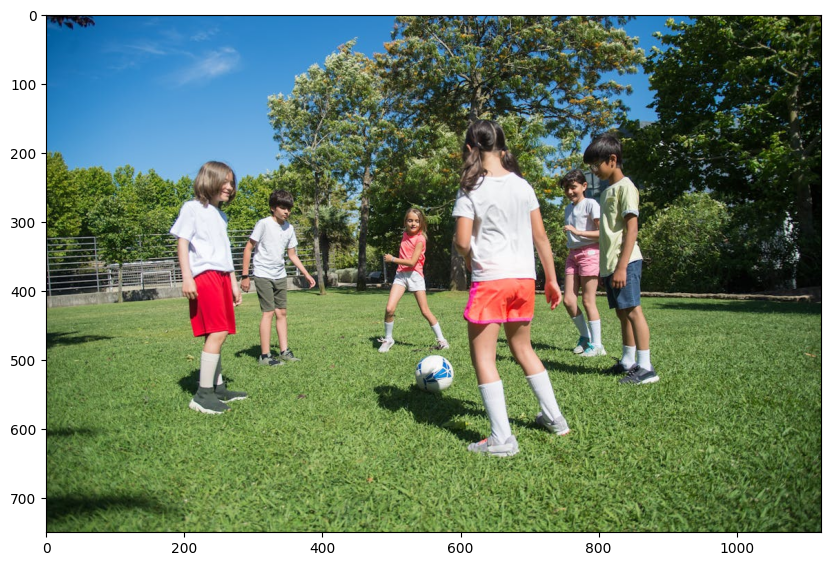

In [1]:
from PIL import Image
import matplotlib.pyplot as plt

image_file = ".././images/football_teamplay.jpeg"
#display the image


img = Image.open(image_file)

plt.figure(figsize=(10, 8))  # Width: 12 inches, Height: 8 inches
plt.imshow(img)

# Single object : OnePoint

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 358M/358M [00:12<00:00, 30.6MB/s] 


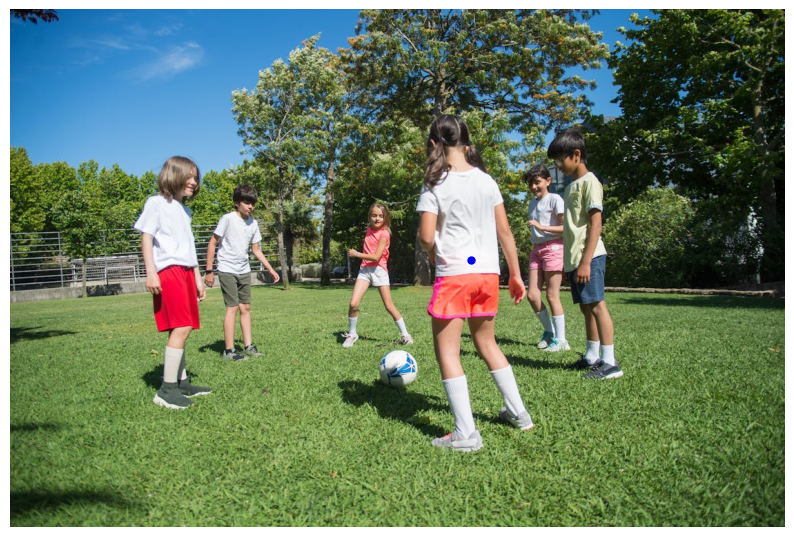


0: 1024x1024 1 0, 356.5ms
Speed: 17.1ms preprocess, 356.5ms inference, 18.4ms postprocess per image at shape (1, 3, 1024, 1024)


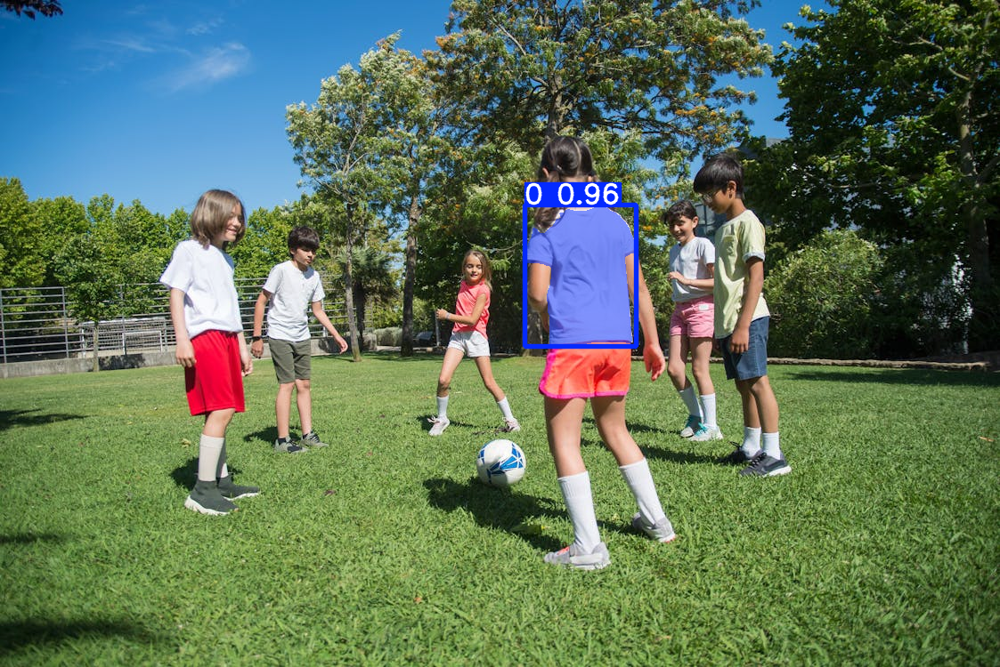

In [2]:
from ultralytics import SAM
from PIL import Image
import matplotlib.pyplot as plt

# Load the SAM model
model = SAM('sam_b.pt')

# Define the image path
image_path = ".././images/football_teamplay.jpeg"

# Load the image using PIL
image = Image.open(image_path)

# Specify multiple points for the same object and their labels
points = [[667, 362]]  # Coordinates of points
labels = [1]  # All points labeled as foreground (1)

# Group points and labels into a list for a single object
points_per_object = [points]
labels_per_object = [labels]

# Create a figure with a larger size
plt.figure(figsize=(10, 8))  # Width: 12 inches, Height: 8 inches

# Display the image
plt.imshow(image)
plt.axis('off')  # Hide axes

# Overlay points on the image
for point in points:
    x, y = point
    plt.plot(x, y, 'bo', markersize=5)  # 'ro' means red color, circle marker

# Show the image with points
plt.show()

# Run inference with multiple points for the same object
results = model(image, points=points_per_object, labels=labels_per_object)

# Display the segmentation results
results[0].show()



# Single object : tree Point


0: 1024x1024 1 0, 37.7ms
Speed: 1.6ms preprocess, 37.7ms inference, 0.2ms postprocess per image at shape (1, 3, 1024, 1024)


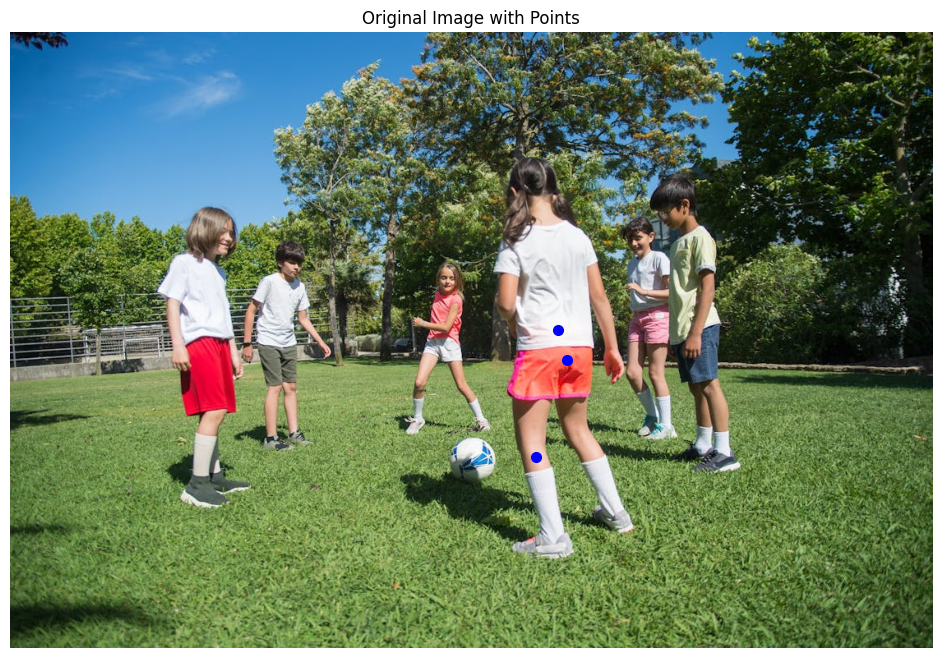

Single-Object Segmentation:


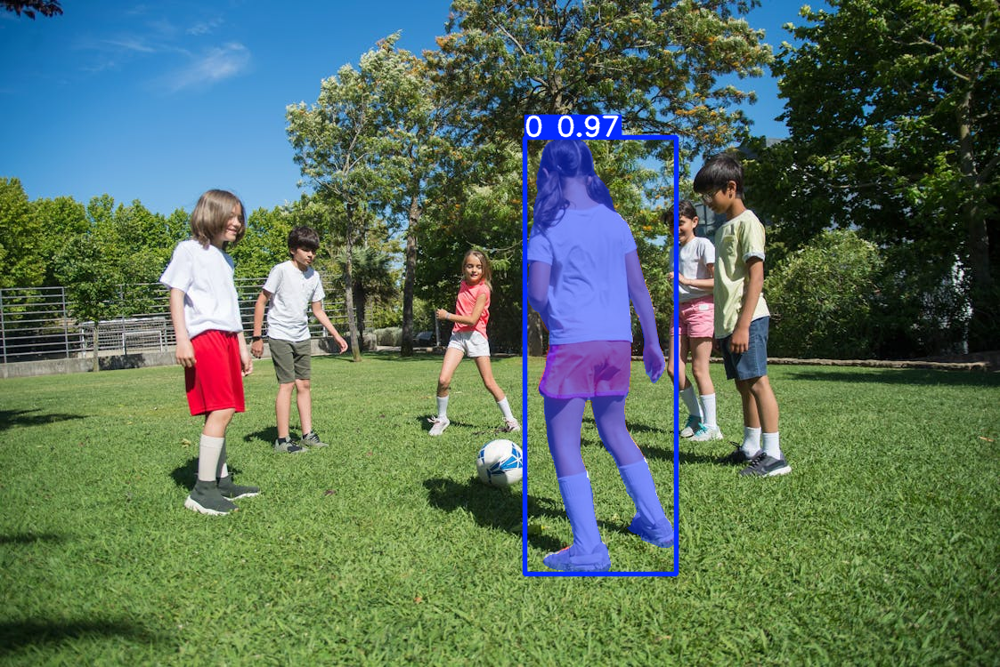

In [3]:
from ultralytics import SAM
from PIL import Image
import matplotlib.pyplot as plt

# Load the SAM model
model = SAM('sam_b.pt')

# Define the image path (your uploaded image)
image_path =  ".././images/football_teamplay.jpeg"

# Load the image using PIL
image = Image.open(image_path)

# Define points and labels for single-object segmentation
single_object_points = [[667, 362], [640, 517], [678, 399]]  # 3 points
single_object_labels = [1, 1, 1]  # All points labeled as foreground (1)

single_object_results = model(image, points=[single_object_points], labels=[single_object_labels])


# Visualize the results
# Display original image with points
plt.figure(figsize=(12, 8))
plt.imshow(image)
plt.axis('off')
for point in single_object_points:
    x, y = point
    plt.plot(x, y, 'bo', markersize=7)  # Single object points (red)


plt.title("Original Image with Points")
plt.show()

# Show single-object segmentation result
print("Single-Object Segmentation:")
single_object_results[0].show()

# Multi objects : tree Point


0: 1024x1024 1 0, 1 1, 1 2, 220.4ms
Speed: 5.7ms preprocess, 220.4ms inference, 0.7ms postprocess per image at shape (1, 3, 1024, 1024)


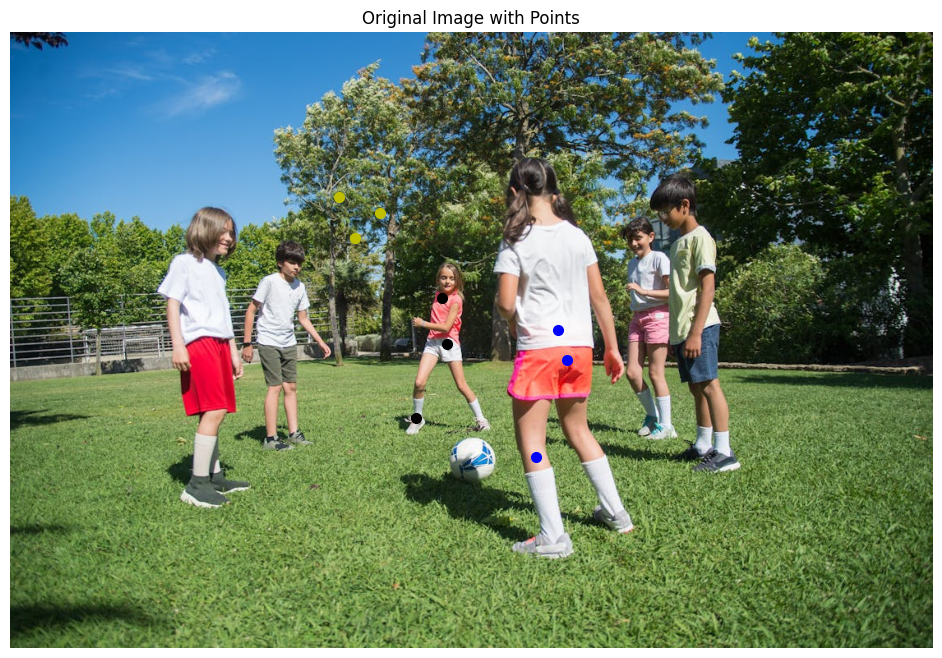

Multi-Object Segmentation:


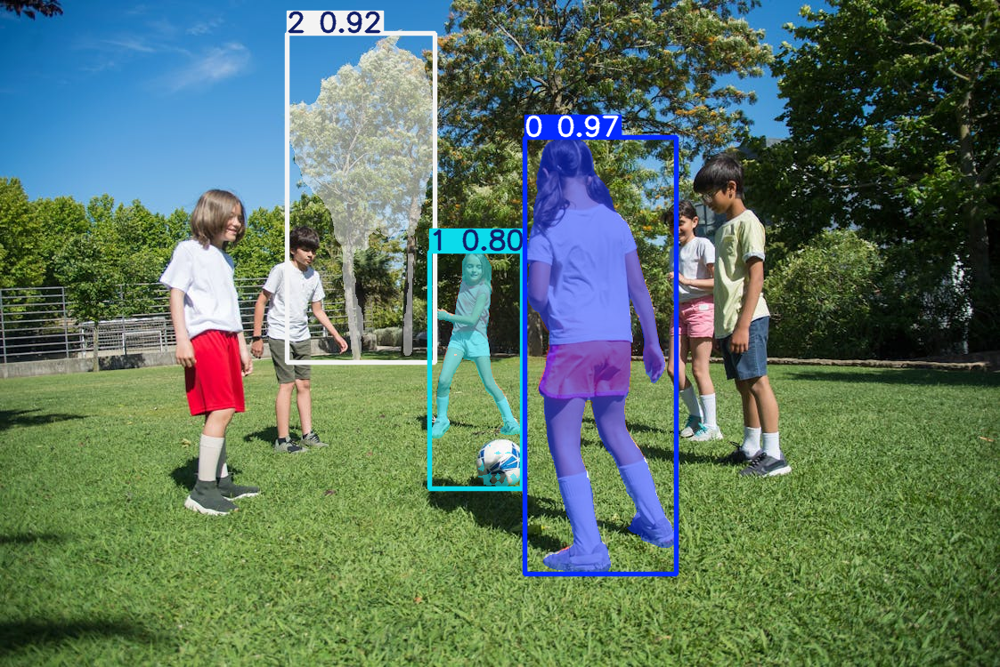

In [2]:
from ultralytics import SAM
from PIL import Image
import matplotlib.pyplot as plt

# Load the SAM model
model = SAM('sam_b.pt')

# Define the image path (your uploaded image)
image_path =  ".././images/football_teamplay.jpeg"

# Load the image using PIL
image = Image.open(image_path)

# Define points and labels for multi-object segmentation
multi_object_points = [
    [[667, 362], [640, 517], [678, 399]],  # Object 1
    [[526, 323], [531, 379], [494, 470]],  # Object 2
    [[400, 200], [420, 250], [450, 220]]   # Object 3
]
multi_object_labels = [
    [1, 1, 1],  # Labels for Object 1
    [1, 1, 1],  # Labels for Object 2
    [1, 1, 1]   # Labels for Object 3
]



# Run inference for multi-object segmentation
multi_object_results = model(image, points=multi_object_points, labels=multi_object_labels)

plt.figure(figsize=(12, 8))
plt.imshow(image)
plt.axis('off')

# Overlay multi-object points with different colors
colors = ['bo', 'ko', 'yo']  # Blue, green, yellow
for obj_idx, points in enumerate(multi_object_points):
    for point in points:
        x, y = point
        plt.plot(x, y, colors[obj_idx], markersize=7)

plt.title("Original Image with Points")
plt.show()


# Show multi-object segmentation result
print("Multi-Object Segmentation:")
for result in multi_object_results:
    result.show()


# To apply the SAM (Segment Anything Model) with model.prediction


0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 1 31, 1 32, 1 33, 1 34, 1 35, 1 36, 1 37, 1 38, 1 39, 1 40, 1 41, 1 42, 1 43, 4502.7ms
Speed: 25.3ms preprocess, 4502.7ms inference, 1.4ms postprocess per image at shape (1, 3, 1024, 1024)


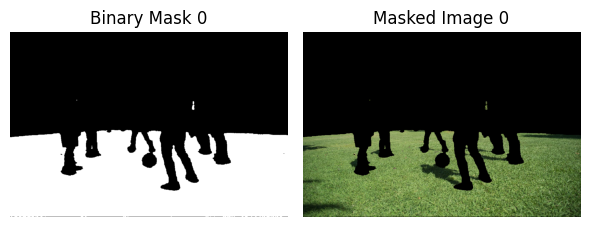

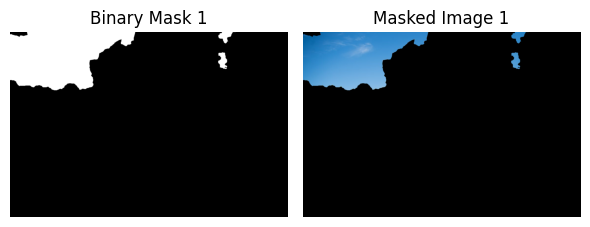

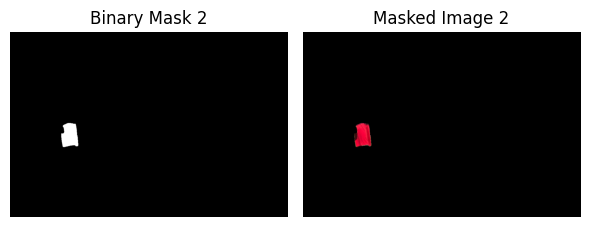

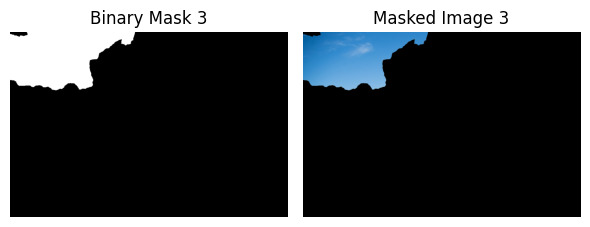

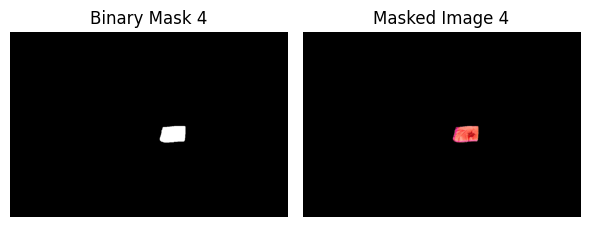

...

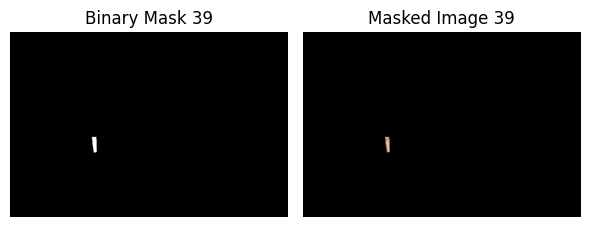

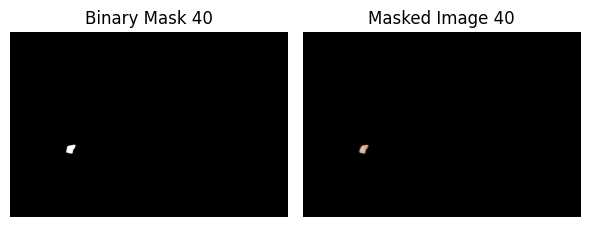

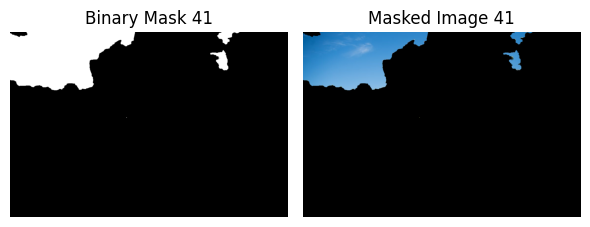

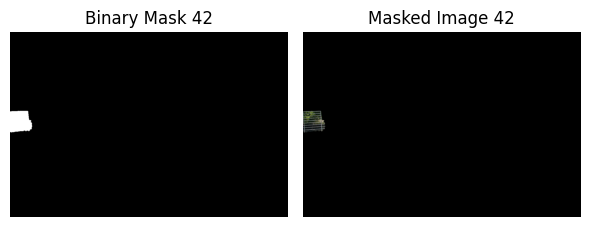

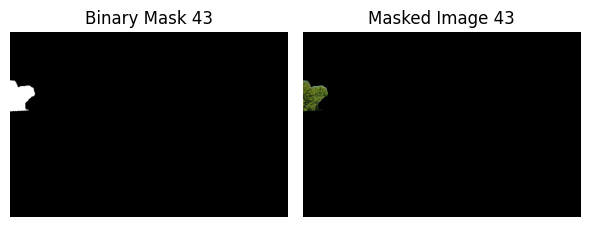

In [7]:


import cv2
import matplotlib.pyplot as plt
import numpy as np

image_path =  ".././images/football_teamplay.jpeg"


# Load the original image
orig_img = cv2.imread(image_path)

orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib

results = model.predict(orig_img_rgb)


# Process masks if available
if results[0].masks is not None:
    masks = results[0].masks.data  # Mask data is a tensor or NumPy array
    for i, mask in enumerate(masks):
        # Convert mask to a binary NumPy array (if needed)
        mask_np = mask.cpu().numpy().astype(np.uint8) if hasattr(mask, 'cpu') else mask.astype(np.uint8)

        # Ensure mask is properly shaped (e.g., HxW)
        mask_np = mask_np.squeeze()  # Remove singleton dimensions, if any

        # Apply the mask to the original image using bitwise AND
        masked_image = cv2.bitwise_and(orig_img_rgb, orig_img_rgb, mask=mask_np)

        # Create a combined plot with mask_np and masked_image
        plt.figure(figsize=(6, 4))
        
        # Plot the binary mask
        plt.subplot(1, 2, 1)
        plt.imshow(mask_np, cmap='gray')  # Display the mask in grayscale
        plt.axis('off')
        plt.title(f'Binary Mask {i}')
        
        # Plot the masked image
        plt.subplot(1, 2, 2)
        plt.imshow(masked_image)
        plt.axis('off')
        plt.title(f'Masked Image {i}')
        
        # Show the combined plot
        plt.tight_layout()
        plt.show()
